## Azure AI Foundry: Image Editing with FLUX models

### Environment Setup
pip install requests pillow azure-identity

In [1]:
# Import required packages
import os
import requests
import base64
from io import BytesIO
from PIL import Image
from IPython.display import display
from azure.identity import DefaultAzureCredential

In [ ]:
# Set environment variables
AZURE_FOUNDRY_ENDPOINT_BFL = os.getenv(
    "AZURE_FOUNDRY_ENDPOINT_BFL",
    "https://<YOUR_RESOURCE>.services.ai.azure.com/"
)
FLUX_v1_DEPLOYMENT = os.getenv("FLUX_v1_DEPLOYMENT", "flux-kontext-pro")
FLUX_v2_DEPLOYMENT = os.getenv("FLUX_v2_DEPLOYMENT", "flux-2-pro")
SOURCE_IMAGE = "images/Source_ZenMaster.png" 

In [3]:
# Set model configurations
FLUX_MODELS = {
    "flux-kontext-pro": {
        "endpoint": AZURE_FOUNDRY_ENDPOINT_BFL,
        "path": f"providers/blackforestlabs/v1/flux-kontext-pro",
        "api_version": "preview",
        "model_name": FLUX_v1_DEPLOYMENT
    },
    "flux-2-pro": {
        "endpoint": AZURE_FOUNDRY_ENDPOINT_BFL,
        "path": f"providers/blackforestlabs/v1/flux-2-pro",
        "api_version": "preview",
        "model_name": FLUX_v2_DEPLOYMENT
    }
}

In [4]:
# Retrieve Entra ID credentials
credential = DefaultAzureCredential()
token_response = credential.get_token("https://cognitiveservices.azure.com/.default")

In [5]:
# Define helper functions
def load_image_as_base64(image_path):
    """Load a local image file and convert it to base64 string."""
    with open(image_path, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode("utf-8")

def get_image_dimensions(image_path):
    """Get width and height of an image, rounded to multiples of 16."""
    with Image.open(image_path) as img:
        width, height = img.size
        # Round to multiples of 16 (required by FLUX models)
        width = (width // 16) * 16
        height = (height // 16) * 16
        return width, height

def show_image(response_data):
    """Display image from API response."""
    if 'error' in response_data:
        print(f"Error: {response_data['error']}")
        return
    if 'data' not in response_data:
        print(f"Unexpected response: {response_data}")
        return
    
    data = response_data['data']
    b64_img = data[0]['b64_json']
    image = Image.open(BytesIO(base64.b64decode(b64_img)))
    print(f"Output image size: {image.size}")
    display(image)
    return image

def edit_image(model_key, image_path, prompt, output_format="png", safety_tolerance=2):
    """Edit an image using the specified FLUX model."""
    config = FLUX_MODELS[model_key]
    input_image_b64 = load_image_as_base64(image_path)
    width, height = get_image_dimensions(image_path)
    
    url = f"{config['endpoint']}{config['path']}?api-version={config['api_version']}"
    
    body = {
        "prompt": prompt,
        "input_image": input_image_b64,
        "width": width,
        "height": height,
        "output_format": output_format,
        "safety_tolerance": safety_tolerance,
        "model": config["model_name"]
    }
    
    print(f"Model: {model_key}")
    print(f"Source image size: ({width}, {height})")
    
    response = requests.post(
        url,
        headers={
            'Authorization': 'Bearer ' + token_response.token,
            'Content-Type': 'application/json',
        },
        json=body
    )
    
    if response.status_code != 200:
        print(f"Status: {response.status_code}")
        print(f"URL: {url}")
        print(f"Response: {response.text[:500]}")
        return None

    result = response.json()
    return show_image(result)

### Retrieval of Source Image

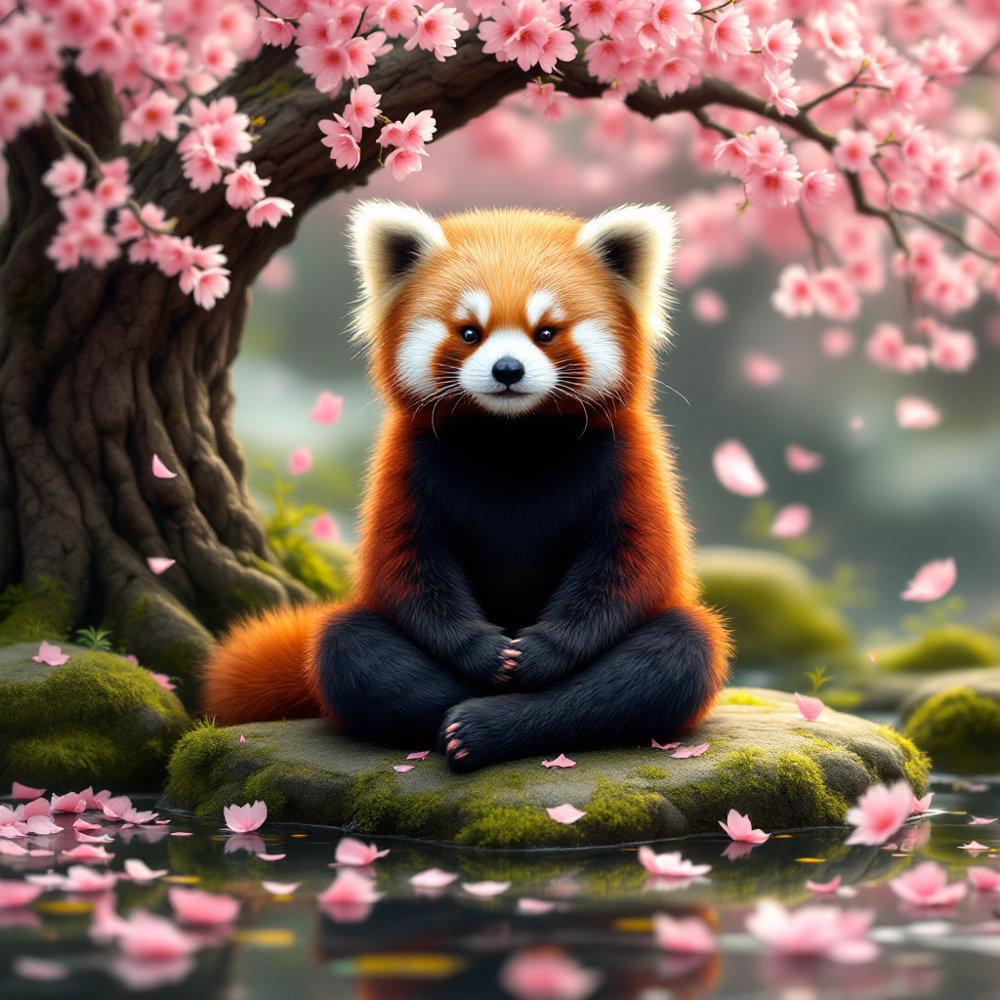

In [6]:
# Show the original image
original = Image.open(SOURCE_IMAGE)
display(original)

### Image Editing with FLUX.1-Kontext-pro

Model: flux-kontext-pro
Source image size: (1024, 1024)
Output image size: (1024, 1024)


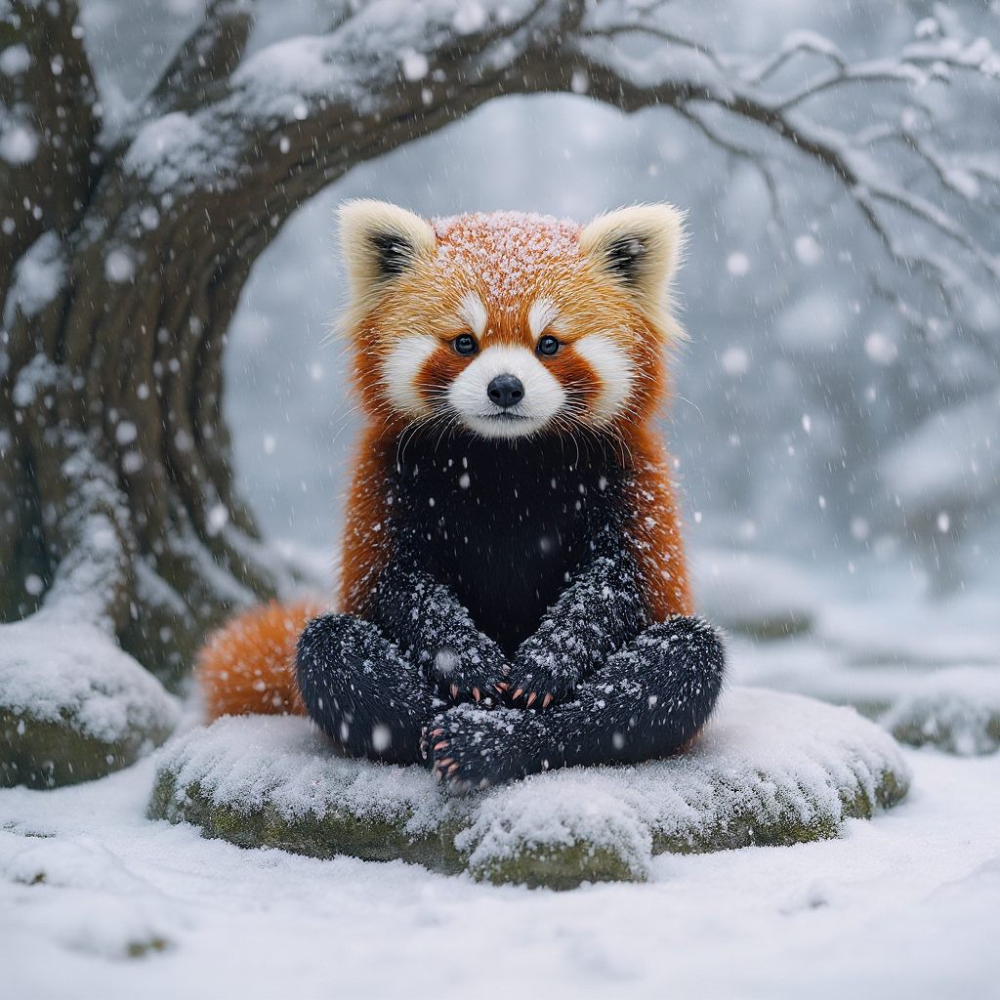

In [7]:
# FLUX.1-Kontext-pro - Change weather to snowing
edited_kontext = edit_image(
    "flux-kontext-pro",
    SOURCE_IMAGE,
    "Change the weather to snowing, add snowflakes falling, winter atmosphere, keep the red panda in the same pose"
)

### Image Editing with FLUX.2-pro

Model: flux-2-pro
Source image size: (1024, 1024)
Output image size: (1024, 1024)


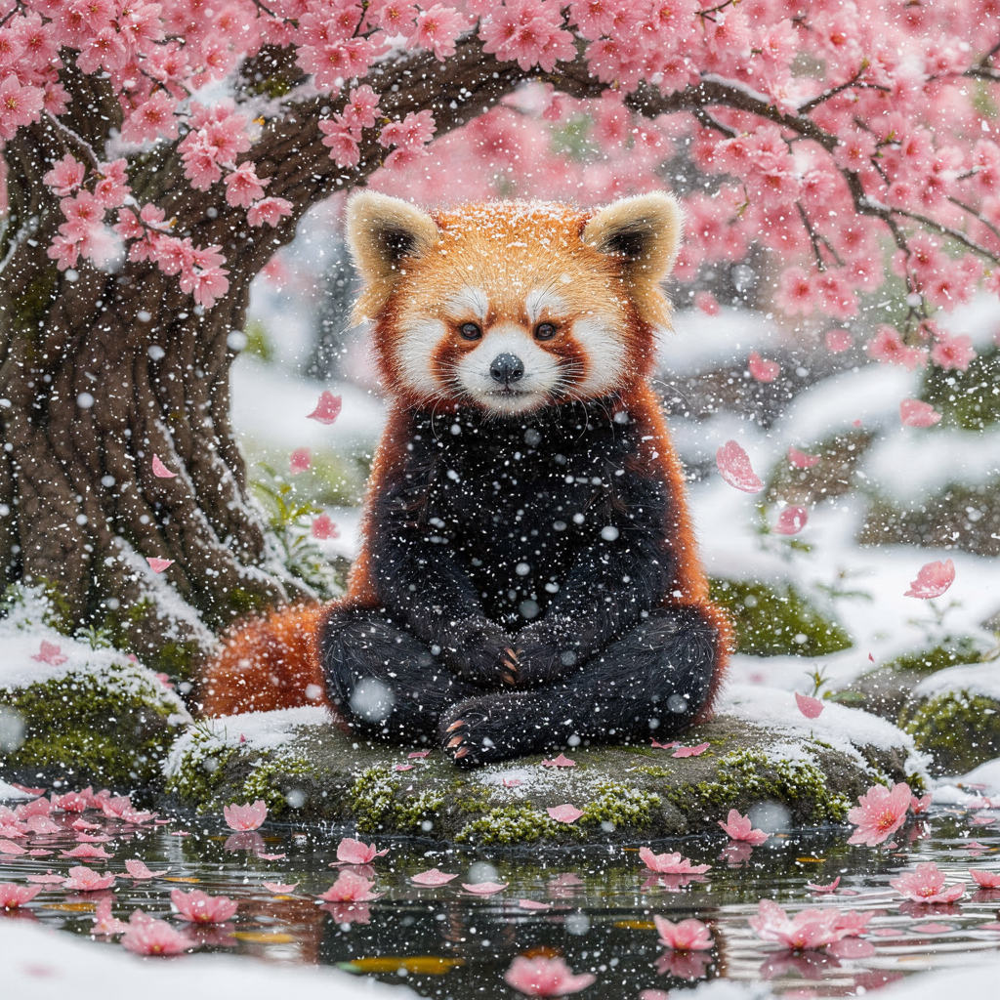

In [8]:
# FLUX-2-pro - Change weather to snowing
edited_flux2 = edit_image(
    "flux-2-pro",
    SOURCE_IMAGE,
    "Change the weather to snowing, add snowflakes falling, winter atmosphere, keep the red panda in the same pose"
)